**Import Library**

In [4]:
import pandas as pd              # data manipulation
import numpy as np               # numerical operations
import matplotlib.pyplot as plt  # plotting
import seaborn as sns            # statistical visuals
import plotly.express as px  # interactive visuals
import calendar             # month name handling   
from matplotlib.ticker import StrMethodFormatter  # format y-axis labels

import requests                  # download data
import zipfile, os                 # handle zip files
import io                        # in-memory file handling
from datetime import datetime    # date/time handling

from mlxtend.frequent_patterns import apriori, association_rules  # market basket analysis
from sklearn.preprocessing import StandardScaler  # feature scaling
from sklearn.cluster import KMeans                # clustering

import warnings
warnings.filterwarnings('ignore')  # suppress warnings

print("Libraries imported.")

Libraries imported.


**Download Dataset from UCI**

In [3]:
# Download the zip file
# Absolute path where you want to save the dataset
save_path = "/Users/2020m1/Downloads/Github-Repos/Customer-Market-Basket-Analytics/data"
url = "https://archive.ics.uci.edu/static/public/352/online+retail.zip"
r = requests.get(url)
zip_path = os.path.join(save_path, "online_retail.zip")
with open(zip_path, "wb") as f:
    f.write(r.content)
# Extract the zip file
with zipfile.ZipFile(zip_path, 'r') as z:
    z.extractall(save_path)

# List extracted files
print("Files in data folder:")
print(os.listdir(save_path))

Files in data folder:
['online_retail.zip', 'Online Retail.xlsx']


**Load Data & Initial Inspection**

In [5]:
df = pd.read_excel("/Users/2020m1/Downloads/Github-Repos/Customer-Market-Basket-Analytics/data/Online Retail.xlsx")
print(f"Shape: {df.shape}")
df.head()

Shape: (541909, 8)


,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom


**Auto EDA**

In [6]:
from ydata_profiling import ProfileReport

profile = ProfileReport(df, title='Initial Data Scan', minimal=True)
profile.to_notebook_iframe()

print("Dataset shape:", df.shape)
print("\nData types:")
print(df.dtypes)
print("\nMissing values:")
print(df.isna().sum())



Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 8/8 [00:00<00:00, 71.05it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Dataset shape: (541909, 8)

Data types:
InvoiceNo              object
StockCode              object
Description            object
Quantity                int64
InvoiceDate    datetime64[ns]
UnitPrice             float64
CustomerID            float64
Country                object
dtype: object

Missing values:
InvoiceNo           0
StockCode           0
Description      1454
Quantity            0
InvoiceDate         0
UnitPrice           0
CustomerID     135080
Country             0
dtype: int64


In [6]:
#viewing rows without CustomerID (required for RFM)
df[df['CustomerID'].isnull()]

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
622,536414,22139,NaN,56,2010-12-01 11:52:00,0.00,NaN,United Kingdom
1443,536544,21773,DECORATIVE ROSE BATHROOM BOTTLE,1,2010-12-01 14:32:00,2.51,NaN,United Kingdom
1444,536544,21774,DECORATIVE CATS BATHROOM BOTTLE,2,2010-12-01 14:32:00,2.51,NaN,United Kingdom
1445,536544,21786,POLKADOT RAIN HAT,4,2010-12-01 14:32:00,0.85,NaN,United Kingdom
1446,536544,21787,RAIN PONCHO RETROSPOT,2,2010-12-01 14:32:00,1.66,NaN,United Kingdom
...,...,...,...,...,...,...,...,...
541536,581498,85099B,JUMBO BAG RED RETROSPOT,5,2011-12-09 10:26:00,4.13,NaN,United Kingdom
541537,581498,85099C,JUMBO BAG BAROQUE BLACK WHITE,4,2011-12-09 10:26:00,4.13,NaN,United Kingdom
541538,581498,85150,LADIES & GENTLEMEN METAL SIGN,1,2011-12-09 10:26:00,4.96,NaN,United Kingdom
541539,581498,85174,S/4 CACTI CANDLES,1,2011-12-09 10:26:00,10.79,NaN,United Kingdom


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 541909 entries, 0 to 541908
Data columns (total 8 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   InvoiceNo    541909 non-null  object        
 1   StockCode    541909 non-null  object        
 2   Description  540455 non-null  object        
 3   Quantity     541909 non-null  int64         
 4   InvoiceDate  541909 non-null  datetime64[ns]
 5   UnitPrice    541909 non-null  float64       
 6   CustomerID   406829 non-null  float64       
 7   Country      541909 non-null  object        
dtypes: datetime64[ns](1), float64(2), int64(1), object(4)
memory usage: 33.1+ MB


In [8]:
df.loc[df.Country == 'United Kingdom']

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
...,...,...,...,...,...,...,...,...
541889,581585,22466,FAIRY TALE COTTAGE NIGHT LIGHT,12,2011-12-09 12:31:00,1.95,15804.0,United Kingdom
541890,581586,22061,LARGE CAKE STAND HANGING STRAWBERY,8,2011-12-09 12:49:00,2.95,13113.0,United Kingdom
541891,581586,23275,SET OF 3 HANGING OWLS OLLIE BEAK,24,2011-12-09 12:49:00,1.25,13113.0,United Kingdom
541892,581586,21217,RED RETROSPOT ROUND CAKE TINS,24,2011-12-09 12:49:00,8.95,13113.0,United Kingdom


In [7]:
df.InvoiceNo.describe()

count     541909
unique     25900
top       573585
freq        1114
Name: InvoiceNo, dtype: int64

In [10]:
#view the first 10 cancelled transactions (InvoiceNo starting with 'C')
df[df['InvoiceNo'].astype(str).str.startswith('C')]['InvoiceNo'].head(10)

141    C536379
154    C536383
235    C536391
236    C536391
237    C536391
238    C536391
239    C536391
240    C536391
241    C536391
939    C536506
Name: InvoiceNo, dtype: object

In [11]:
#viewing negative or zero quantities
df[df['Quantity'] <= 0]

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
141,C536379,D,Discount,-1,2010-12-01 09:41:00,27.50,14527.0,United Kingdom
154,C536383,35004C,SET OF 3 COLOURED FLYING DUCKS,-1,2010-12-01 09:49:00,4.65,15311.0,United Kingdom
235,C536391,22556,PLASTERS IN TIN CIRCUS PARADE,-12,2010-12-01 10:24:00,1.65,17548.0,United Kingdom
236,C536391,21984,PACK OF 12 PINK PAISLEY TISSUES,-24,2010-12-01 10:24:00,0.29,17548.0,United Kingdom
237,C536391,21983,PACK OF 12 BLUE PAISLEY TISSUES,-24,2010-12-01 10:24:00,0.29,17548.0,United Kingdom
...,...,...,...,...,...,...,...,...
540449,C581490,23144,ZINC T-LIGHT HOLDER STARS SMALL,-11,2011-12-09 09:57:00,0.83,14397.0,United Kingdom
541541,C581499,M,Manual,-1,2011-12-09 10:28:00,224.69,15498.0,United Kingdom
541715,C581568,21258,VICTORIAN SEWING BOX LARGE,-5,2011-12-09 11:57:00,10.95,15311.0,United Kingdom
541716,C581569,84978,HANGING HEART JAR T-LIGHT HOLDER,-1,2011-12-09 11:58:00,1.25,17315.0,United Kingdom


In [12]:
#view zero or negative prices
df[df['UnitPrice'] <= 0]

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
622,536414,22139,NaN,56,2010-12-01 11:52:00,0.0,NaN,United Kingdom
1970,536545,21134,NaN,1,2010-12-01 14:32:00,0.0,NaN,United Kingdom
1971,536546,22145,NaN,1,2010-12-01 14:33:00,0.0,NaN,United Kingdom
1972,536547,37509,NaN,1,2010-12-01 14:33:00,0.0,NaN,United Kingdom
1987,536549,85226A,NaN,1,2010-12-01 14:34:00,0.0,NaN,United Kingdom
...,...,...,...,...,...,...,...,...
536981,581234,72817,NaN,27,2011-12-08 10:33:00,0.0,NaN,United Kingdom
538504,581406,46000M,POLYESTER FILLER PAD 45x45cm,240,2011-12-08 13:58:00,0.0,NaN,United Kingdom
538505,581406,46000S,POLYESTER FILLER PAD 40x40cm,300,2011-12-08 13:58:00,0.0,NaN,United Kingdom
538554,581408,85175,NaN,20,2011-12-08 14:06:00,0.0,NaN,United Kingdom


In [13]:
#viewing InvoiceDate data type
print("InvoiceDate data type:", df['InvoiceDate'].dtype)

InvoiceDate data type: datetime64[ns]


In [14]:
df.describe(include='all')

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
count,541909.0,541909,540455,541909.000000,541909,541909.000000,406829.000000,541909
unique,25900.0,4070,4223,NaN,NaN,NaN,NaN,38
top,573585.0,85123A,WHITE HANGING HEART T-LIGHT HOLDER,NaN,NaN,NaN,NaN,United Kingdom
freq,1114.0,2313,2369,NaN,NaN,NaN,NaN,495478
mean,NaN,NaN,NaN,9.552250,2011-07-04 13:34:57.156386048,4.611114,15287.690570,NaN
min,NaN,NaN,NaN,-80995.000000,2010-12-01 08:26:00,-11062.060000,12346.000000,NaN
25%,NaN,NaN,NaN,1.000000,2011-03-28 11:34:00,1.250000,13953.000000,NaN
50%,NaN,NaN,NaN,3.000000,2011-07-19 17:17:00,2.080000,15152.000000,NaN
75%,NaN,NaN,NaN,10.000000,2011-10-19 11:27:00,4.130000,16791.000000,NaN
max,NaN,NaN,NaN,80995.000000,2011-12-09 12:50:00,38970.000000,18287.000000,NaN


**Data Cleaning**


In [57]:
# make a copy of the original dataframe for cleaning
cleaned_df = df.copy()
cleaned_df.head()


,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom


In [58]:
#checking for duplicates
duplicate_count = cleaned_df.duplicated().sum()
#store duplicate before dropping
duplicates = cleaned_df[cleaned_df.duplicated()]
print(f"Number of duplicate rows: {duplicates.shape[0]}")

Number of duplicate rows: 5268


In [59]:
#inspect the duplicate rows (if any)
duplicates = cleaned_df[cleaned_df.duplicated()]
print("Duplicate rows:")
print(duplicates)

Duplicate rows:
       InvoiceNo StockCode                        Description  Quantity  \
517       536409     21866        UNION JACK FLAG LUGGAGE TAG         1   
527       536409     22866      HAND WARMER SCOTTY DOG DESIGN         1   
537       536409     22900    SET 2 TEA TOWELS I LOVE LONDON          1   
539       536409     22111       SCOTTIE DOG HOT WATER BOTTLE         1   
555       536412     22327  ROUND SNACK BOXES SET OF 4 SKULLS         1   
...          ...       ...                                ...       ...   
541675    581538     22068        BLACK PIRATE TREASURE CHEST         1   
541689    581538     23318     BOX OF 6 MINI VINTAGE CRACKERS         1   
541692    581538     22992             REVOLVER WOODEN RULER          1   
541699    581538     22694                       WICKER STAR          1   
541701    581538     23343       JUMBO BAG VINTAGE CHRISTMAS          1   

               InvoiceDate  UnitPrice  CustomerID         Country  
517    2010-12-

In [60]:
#drop duplicates
cleaned_df = cleaned_df.drop_duplicates()
#verify duplicates are removed
duplicate_count_after = cleaned_df.duplicated().sum()
#print number of duplicates before and after
print(f"Number of duplicate rows before removal: {duplicates.shape[0]}")
print(f"Number of duplicate rows after removal: {duplicate_count_after}")

Number of duplicate rows before removal: 5268
Number of duplicate rows after removal: 0


In [61]:
#remove noise items from the description column (e.g., 'POSTAGE)
noise_terms = [
    'POSTAGE',
    'DOTCOM POSTAGE',
    'MANUAL',
    'BANK CHARGES',
    'NEXT DAY CARRIAGE',
    'PACKING CHARGE',
    'HIGH RESOLUTION IMAGE'
]

# Create safe regex pattern with word boundaries
pattern = r'\b(' + '|'.join(noise_terms) + r')\b'

# Store original row count
rows_before = len(cleaned_df)

# Remove noise items
cleaned_df = cleaned_df[
    ~cleaned_df['Description'].str.contains(pattern, case=False, na=False)
]

# Store new row count
rows_after = len(cleaned_df)

print(f"Rows removed: {rows_before - rows_after}")
print(f"Remaining rows: {rows_after}")

Rows removed: 2664
Remaining rows: 533977


**Standardized Cleaning Pipeline**

In [62]:
#Remove rows without CustomerID (required for RFM)
cleaned_df = cleaned_df.dropna(subset=['CustomerID'])
#Remove cancelled invoices
cleaned_df['InvoiceNo'] = cleaned_df['InvoiceNo'].astype(str) #convert to string for startswith
cleaned_df = cleaned_df[~cleaned_df['InvoiceNo'].str.startswith('C')]
#Remove negative or zero quantities
cleaned_df = cleaned_df[cleaned_df['Quantity'] > 0]
#Remove zero or negative prices
cleaned_df = cleaned_df[cleaned_df['UnitPrice'] > 0]
#Convert CustomerID to integer
cleaned_df['CustomerID'] = cleaned_df['CustomerID'].astype(int)

#Convert InvoiceDate to datetime
cleaned_df['InvoiceDate'] = pd.to_datetime(cleaned_df['InvoiceDate'])

#Standardization Data Types [Convert IDs to string for consistency]
cleaned_df['CustomerID'] = cleaned_df['CustomerID'].astype(str)
cleaned_df['InvoiceNo'] = cleaned_df['InvoiceNo'].astype(str)
cleaned_df['StockCode'] = cleaned_df['StockCode'].astype(str)

#Ensure numeric columns are correct data types
cleaned_df['Quantity'] = cleaned_df['Quantity'].astype(int)
cleaned_df['UnitPrice'] = cleaned_df['UnitPrice'].astype(float)


# Create TotalPrice column needed for RFM
cleaned_df['TotalPrice'] = cleaned_df['Quantity'] * cleaned_df['UnitPrice']
cleaned_df['TotalPrice'] = cleaned_df['TotalPrice'].astype(float)

#Optimize categorical data types
cleaned_df['Country'] = cleaned_df['Country'].astype('category')
cleaned_df['Description'] = cleaned_df['Description'].astype('string')

#drop rows with any remaining missing values (if any)
cleaned_df.dropna(inplace=True)
print("Cleaned dataset shape:", cleaned_df.shape)
cleaned_df.head()

Cleaned dataset shape: (391190, 9)


,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,TotalPrice
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850,United Kingdom,15.30
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,20.34
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850,United Kingdom,22.00
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,20.34
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,20.34


In [63]:
#cheking data types after cleaning
cleaned_df.dtypes

InvoiceNo              object
StockCode              object
Description    string[python]
Quantity                int64
InvoiceDate    datetime64[ns]
UnitPrice             float64
CustomerID             object
Country              category
TotalPrice            float64
dtype: object

In [64]:
#describe the numeric columnn of the cleaned dataset
cleaned_df[['UnitPrice', 'Quantity', 'CustomerID', 'TotalPrice']].describe()

,UnitPrice,Quantity,TotalPrice
count,391190.000000,391190.000000,391190.000000
mean,2.887723,13.144058,22.348684
std,4.372065,180.798628,310.916991
min,0.001000,1.000000,0.001000
25%,1.250000,2.000000,4.950000
50%,1.950000,6.000000,11.900000
75%,3.750000,12.000000,19.800000
max,649.500000,80995.000000,168469.600000


In [65]:
#Applying Winsorization Quantile capping (99th percentile)
for col in ['Quantity', 'UnitPrice', 'TotalPrice']:
    lower = cleaned_df[col].quantile(0.01)
    upper = cleaned_df[col].quantile(0.99)
    
    cleaned_df[col] = cleaned_df[col].clip(lower, upper)

print("Outliers capped successfully")

Outliers capped successfully


In [66]:
cleaned_df[['UnitPrice', 'Quantity', 'CustomerID', 'TotalPrice']].describe()

,UnitPrice,Quantity,TotalPrice
count,391190.000000,391190.000000,391190.000000
mean,2.775055,11.050257,18.995356
std,2.627390,18.177578,29.356546
min,0.210000,1.000000,0.550000
25%,1.250000,2.000000,4.950000
50%,1.950000,6.000000,11.900000
75%,3.750000,12.000000,19.800000
max,12.750000,120.000000,201.600000


**Extreme transactional values were treated using 1st-99th percentile Winsorization to stabilize**
**distributions while preserving the full transactional dataset.**

**Statistical EDA Data Analysis and Visualization**

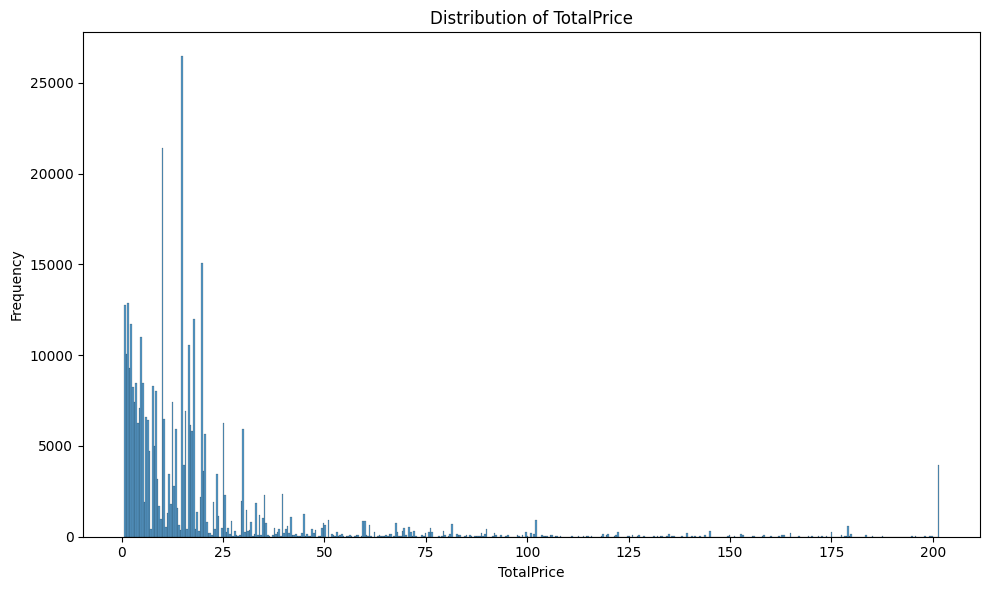

In [67]:
#distribution of TotalPrice
plt.figure(figsize=(10, 6))
sns.histplot(data=cleaned_df, x='TotalPrice')
plt.title('Distribution of TotalPrice')
plt.xlabel('TotalPrice')
plt.ylabel('Frequency')
plt.tight_layout()
plt.savefig('/Users/2020m1/Downloads/Github-Repos/Customer-Market-Basket-Analytics/outputs/Distribution of TotalPrice.png')

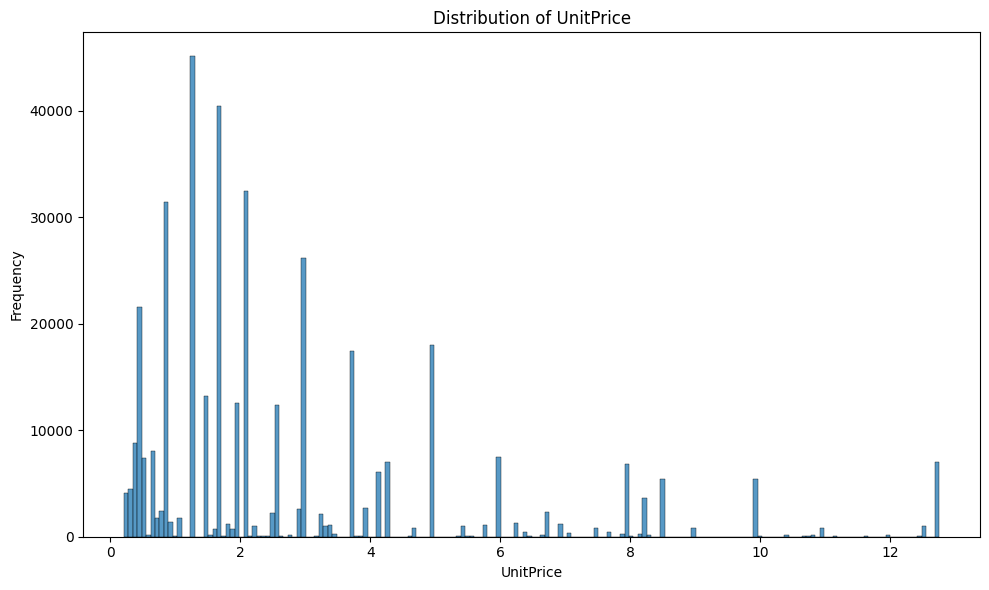

In [68]:
#distribution of UnitPrice
plt.figure(figsize=(10, 6))
sns.histplot(data=cleaned_df, x='UnitPrice')
plt.title('Distribution of UnitPrice')
plt.xlabel('UnitPrice')
plt.ylabel('Frequency')
plt.tight_layout()
plt.savefig('/Users/2020m1/Downloads/Github-Repos/Customer-Market-Basket-Analytics/outputs/Distribution of UnitPrice.png')

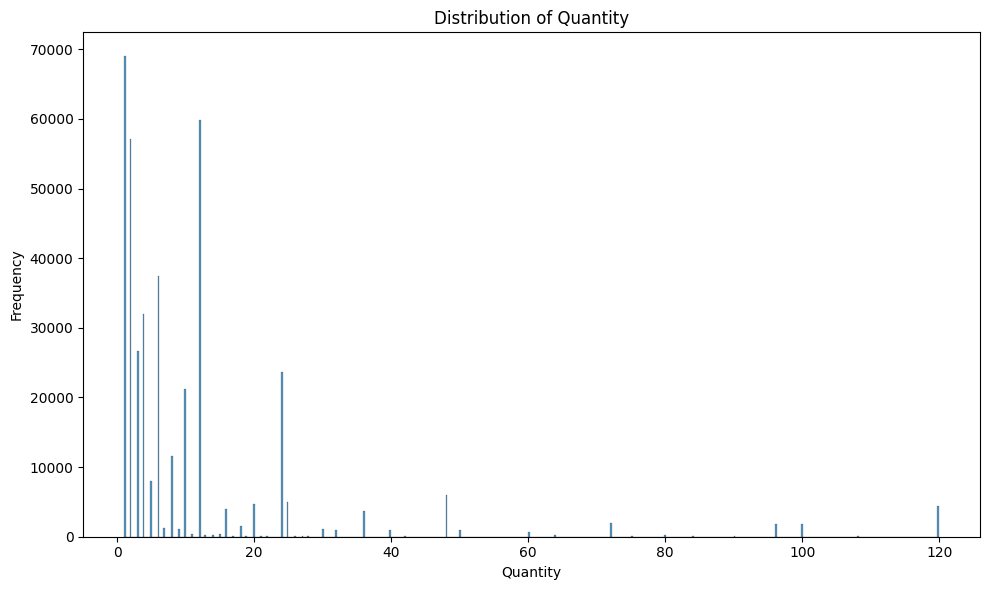

In [69]:
#distribution of Quantity
plt.figure(figsize=(10, 6))
sns.histplot(cleaned_df, x='Quantity')
plt.title('Distribution of Quantity')
plt.xlabel('Quantity')
plt.ylabel('Frequency')
plt.tight_layout()
plt.savefig('/Users/2020m1/Downloads/Github-Repos/Customer-Market-Basket-Analytics/outputs/Distribution of Quantity.png')

In [70]:
#box plot for UnitPrice
fig = px.box(cleaned_df,
             y='UnitPrice',
             title='Box Plot of Unit Price')
# Save as PNG
fig.write_image("/Users/2020m1/Downloads/Github-Repos/Customer-Market-Basket-Analytics/outputs/unitprice_boxplot.png")

fig.show()

In [71]:
#box plot for quantity
fig = px.box(cleaned_df,
             y='Quantity',
             title='Box Plot of Quantity')  
# Save as PNG
fig.write_image("/Users/2020m1/Downloads/Github-Repos/Customer-Market-Basket-Analytics/outputs/quantity_boxplot.png")
fig.show()

In [72]:
#box plot for TotalPrice
fig = px.box(cleaned_df,
             y='TotalPrice',
             title='Box Plot of Total Price')
# Save as PNG
fig.write_image("/Users/2020m1/Downloads/Github-Repos/Customer-Market-Basket-Analytics/outputs/totalprice_boxplot.png")
fig.show()

In [73]:
#top products by total sales
top_products = cleaned_df.groupby('Description')['TotalPrice'].sum().sort_values(ascending=False).head(10)
print("Top 10 products by total sales:")
print(top_products)

Top 10 products by total sales:
Description
REGENCY CAKESTAND 3 TIER              105599.50
WHITE HANGING HEART T-LIGHT HOLDER     70854.71
JUMBO BAG RED RETROSPOT                68391.04
PARTY BUNTING                          58874.13
ASSORTED COLOUR BIRD ORNAMENT          47942.63
PAPER CHAIN KIT 50'S CHRISTMAS         35623.53
CHILLI LIGHTS                          32411.75
SPOTTY BUNTING                         31547.95
RABBIT NIGHT LIGHT                     31449.15
JUMBO BAG PINK POLKADOT                30932.76
Name: TotalPrice, dtype: float64


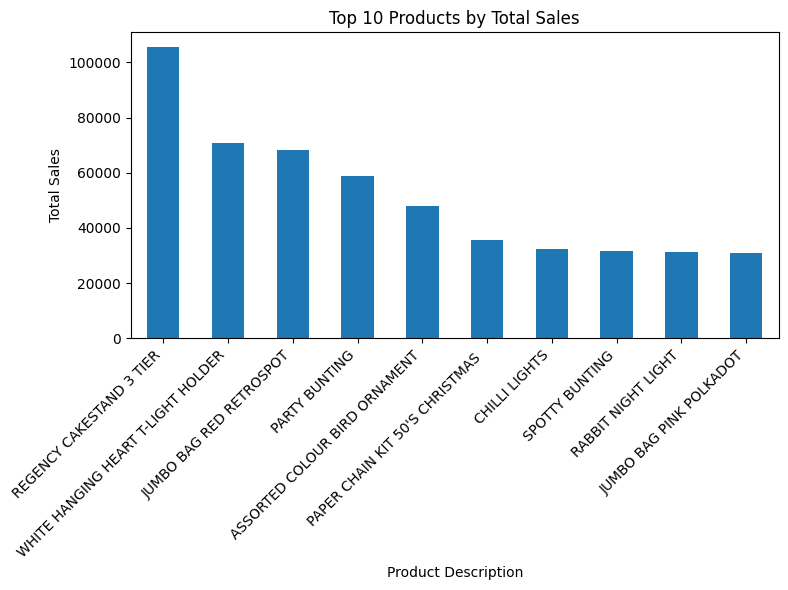

In [74]:
# Plot top 10 products by total sales
plt.figure(figsize=(8,6))  # set figure size

top_products.plot(kind='bar')  # create bar chart

plt.title('Top 10 Products by Total Sales')  # chart title
plt.xlabel('Product Description')  # x-axis label
plt.ylabel('Total Sales')  # y-axis label
plt.xticks(rotation=45, ha='right')  # rotate labels for readability

# Save figure to specified directory
plt.tight_layout()  # adjust layout to prevent cutting labels
plt.savefig('/Users/2020m1/Downloads/Github-Repos/Customer-Market-Basket-Analytics/outputs/top_10_products_sales.png')

In [75]:
#plot of top 5 product descriptions by total sales
top_5_products = (
    cleaned_df.groupby('Description')['TotalPrice']
    .sum()
    .sort_values(ascending=False)
    .head(5)
)

fig = px.pie(
    values=top_5_products.values,
    names=top_5_products.index,
    title='Top 5 Products by Total Sales'
)

fig.write_image("/Users/2020m1/Downloads/Github-Repos/Customer-Market-Basket-Analytics/outputs/top_5_products_pie_chart.png")
fig.show()

In [76]:
#top 10 Revenue distribution by country
country_revenue = cleaned_df.groupby('Country')['TotalPrice'].sum().sort_values(ascending=False).head(10)
print("Top 10 countries by revenue:")
print(country_revenue)

Top 10 countries by revenue:
Country
United Kingdom    6102718.05
Netherlands        231206.49
EIRE               224458.33
Germany            199253.26
France             177789.61
Australia          101058.41
Switzerland         51984.65
Spain               47519.09
Belgium             36927.34
Norway              32100.40
Name: TotalPrice, dtype: float64


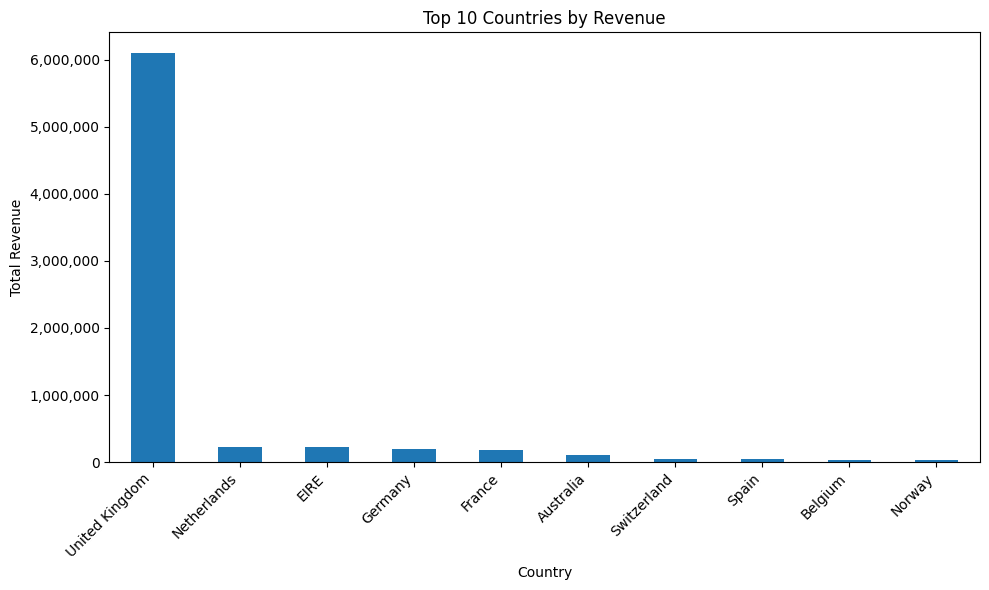

In [77]:
# Plot top 10 countries by revenue
from matplotlib import ticker


plt.figure(figsize=(10,6))  # set figure size

ax = country_revenue.plot(kind='bar')  # create bar chart

plt.title('Top 10 Countries by Revenue')  # chart title
plt.xlabel('Country')  # x-axis label
plt.ylabel('Total Revenue')  # y-axis label
plt.xticks(rotation=45, ha='right')  # rotate country names

# Format y-axis with commas
ax.yaxis.set_major_formatter(ticker.FuncFormatter(lambda x, pos: f'{int(x):,}'))

plt.tight_layout()  # adjust layout

# Save to outputs directory
plt.savefig('/Users/2020m1/Downloads/Github-Repos/Customer-Market-Basket-Analytics/outputs/top_10_countries_revenue.png')

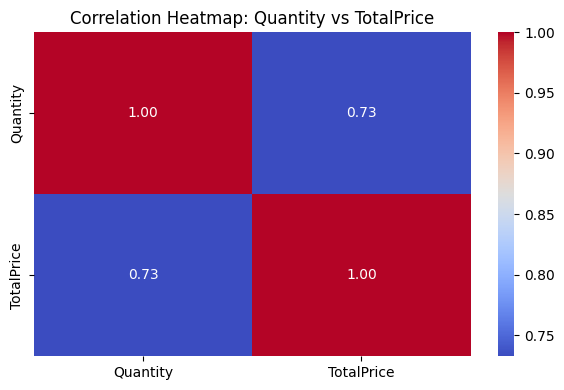

In [78]:
#Correlation between Quantity and TotalPrice heatmap
correlation = cleaned_df[['Quantity', 'TotalPrice']].corr()
plt.figure(figsize=(6,4))
sns.heatmap(correlation, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap: Quantity vs TotalPrice')
plt.tight_layout()
plt.savefig('/Users/2020m1/Downloads/Github-Repos/Customer-Market-Basket-Analytics/outputs/correlation_heatmap.png', bbox_inches='tight')

**Time series Analysis**

In [79]:
#yearly Revenue Trend  
cleaned_df['Year'] = cleaned_df['InvoiceDate'].dt.to_period('Y')
yearly_revenue = cleaned_df.groupby('Year')['TotalPrice'].sum()
print("Yearly Revenue Trend:")
print(yearly_revenue)

Yearly Revenue Trend:
Year
2010     493229.40
2011    6937563.99
Freq: Y-DEC, Name: TotalPrice, dtype: float64


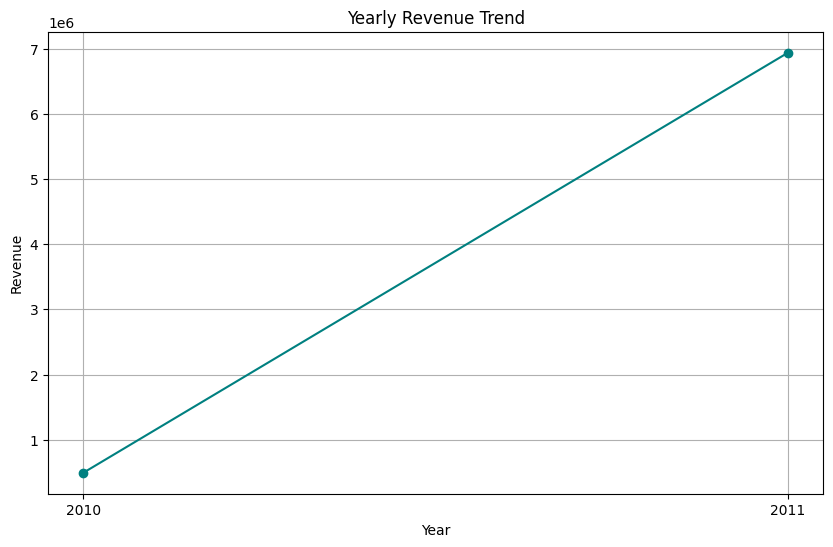

In [80]:
# Plot yearly revenue trend
plt.figure(figsize=(10,6))
plt.plot(yearly_revenue.index.astype(str), yearly_revenue.values, marker='o', linestyle='-', color='teal')
plt.title('Yearly Revenue Trend')
plt.xlabel('Year')
plt.ylabel('Revenue')
plt.grid(True)

# Save plot as PNG
plt.savefig('/Users/2020m1/Downloads/Github-Repos/Customer-Market-Basket-Analytics/outputs/yearly_revenue_trend.png', bbox_inches='tight')

In [85]:
# calcualte distinct month in year for 2010, and 2011
cleaned_df['Month'] = cleaned_df['InvoiceDate'].dt.to_period('M')
months_2010 = cleaned_df[cleaned_df['Year'] == '2010']['Month'].nunique()
months_2011 = cleaned_df[cleaned_df['Year'] == '2011']['Month'].nunique()
print(f"Distinct months in 2010: {months_2010}")
print(f"Distinct months in 2011: {months_2011}")


Distinct months in 2010: 1
Distinct months in 2011: 12


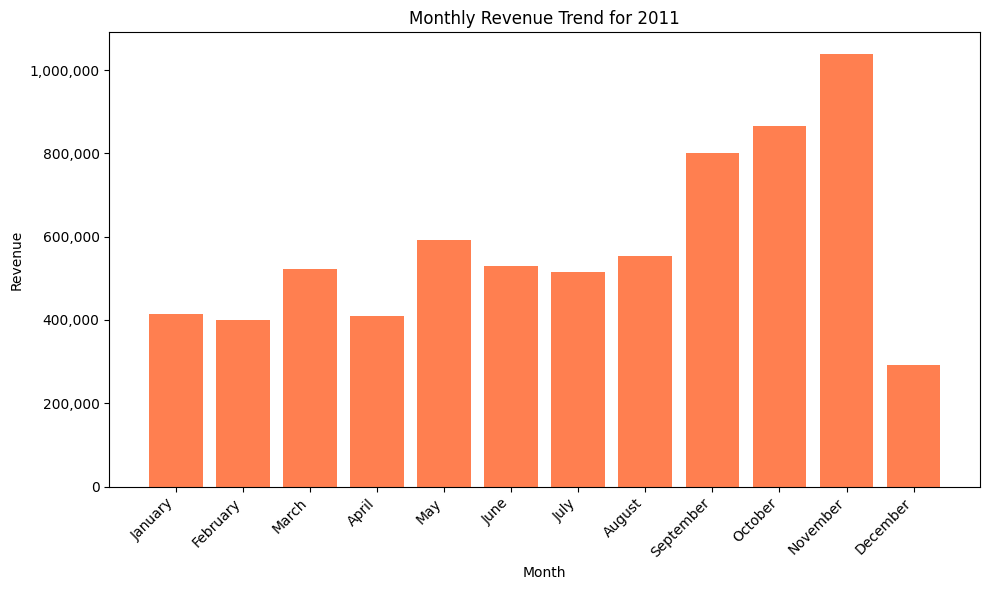

In [87]:
#plot Month and revenue trend for 2011 (all months)
monthly_revenue_2011 = cleaned_df[cleaned_df['Year'] == '2011'].groupby('Month')['TotalPrice'].sum()
month_numbers = [m.month for m in monthly_revenue_2011.index]
month_names = [calendar.month_name[m] for m in month_numbers]
plt.figure(figsize=(10,6))
plt.bar(month_names, monthly_revenue_2011.values, color='coral')
plt.title('Monthly Revenue Trend for 2011')
plt.xlabel('Month')
plt.ylabel('Revenue')
plt.xticks(rotation=45, ha='right')
plt.gca().yaxis.set_major_formatter(StrMethodFormatter('{x:,.0f}'))
plt.tight_layout()
plt.savefig('/Users/2020m1/Downloads/Github-Repos/Customer-Market-Basket-Analytics/outputs/monthly_revenue_trend_2011.png', bbox_inches='tight')
plt.show()

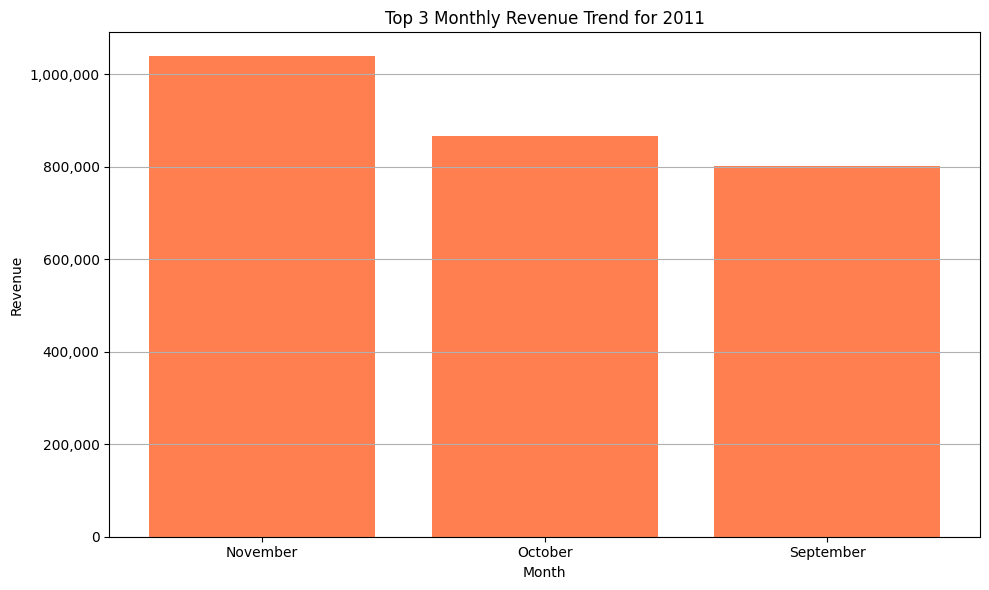

In [89]:
#plot top 3 highest monthly revenue genertaion
top_months_2011 = monthly_revenue_2011.sort_values(ascending=False).head(3)
month_numbers = [m.month for m in top_months_2011.index]
month_names = [calendar.month_name[m] for m in month_numbers]

plt.figure(figsize=(10,6))
plt.bar(month_names, top_months_2011.values, color='coral')
plt.title('Top 3 Monthly Revenue Trend for 2011')
plt.xlabel('Month')
plt.ylabel('Revenue')
plt.grid(axis='y')  
plt.gca().yaxis.set_major_formatter(StrMethodFormatter('{x:,.0f}'))  # Format y-axis with commas
plt.tight_layout()  # adjust layout

# Save plot
plt.savefig('/Users/2020m1/Downloads/Github-Repos/Customer-Market-Basket-Analytics/outputs/top_3_monthly_revenue_2011.png', bbox_inches='tight')

plt.show()

In [90]:
#2011 best Quarter by revenue genration 
# Filter data for 2011
df_2011 = cleaned_df[cleaned_df['InvoiceDate'].dt.year == 2011]
# Create a 'Quarter' column
df_2011['Quarter'] = df_2011['InvoiceDate'].dt.to_period('Q')
# Calculate revenue for each quarter
quarterly_revenue_2011 = df_2011.groupby('Quarter')['TotalPrice'].sum()
# Get the best quarter
best_quarter_2011 = quarterly_revenue_2011.sort_values(ascending=False).head(1)
print("Best Quarterly Revenue Trend for 2011:")
print(best_quarter_2011)

Best Quarterly Revenue Trend for 2011:
Quarter
2011Q4    2197539.29
Freq: Q-DEC, Name: TotalPrice, dtype: float64


**RFM Section**
- 1. Recency
- What it measures: How recently a customer made a purchase.
- Why it's important: More recent customers are more likely to buy again than those who haven’t purchased in a while.

- 2. Frequency (F)
- What it measures: How often a customer makes a purchase within a given period.
- Why it's important: Customers who purchase more frequently are often more loyal and engaged.

- 3. Monetary (M)
- What it measures: How much money a customer spends over a given period.
- Why it's important: Higher monetary values indicate that a customer is spending more, which can help prioritise high-value customers for marketing or retention strategies.

In [91]:
# Calculate RFM Table with proper column names
snapshot_date = cleaned_df['InvoiceDate'].max() + pd.Timedelta(days=1)

rfm = cleaned_df.groupby('CustomerID').agg({
    'InvoiceDate': lambda x: (snapshot_date - x.max()).days,  # Recency
    'InvoiceNo': 'nunique',  # Frequency
    'TotalPrice': 'sum'      # Monetary
}).reset_index()

# Rename columns
rfm.columns = ['CustomerID', 'Recency', 'Frequency', 'Monetary']

# Preview
print("RFM Table:")
print(rfm.head())

RFM Table:
  CustomerID  Recency  Frequency  Monetary
0      12346      326          1    201.60
1      12347        2          7   4262.00
2      12348       75          4   1437.24
3      12349       19          1   1457.55
4      12350      310          1    294.40


In [92]:
# Build RFM Table
snapshot_date = cleaned_df['InvoiceDate'].max() + pd.Timedelta(days=1)

rfm = cleaned_df.groupby('CustomerID').agg({
    'InvoiceDate': lambda x: (snapshot_date - x.max()).days,  # Recency
    'InvoiceNo': 'nunique',  # Frequency
    'TotalPrice': 'sum'       # Monetary
}).reset_index()

rfm.columns = ['CustomerID', 'Recency', 'Frequency', 'Monetary']

#  Calculate RFM Scores
def rfm_score(x):
    # Recency score
    if x['Recency'] <= 30:
        r = 5
    elif x['Recency'] <= 60:
        r = 4
    elif x['Recency'] <= 90:
        r = 3
    elif x['Recency'] <= 180:
        r = 2
    else:
        r = 1

    # Frequency score
    if x['Frequency'] >= 10:
        f = 5
    elif x['Frequency'] >= 7:
        f = 4
    elif x['Frequency'] >= 4:
        f = 3
    elif x['Frequency'] >= 1:
        f = 2
    else:
        f = 1

    # Monetary score
    if x['Monetary'] >= 1000:
        m = 5
    elif x['Monetary'] >= 500:
        m = 4
    elif x['Monetary'] >= 100:
        m = 3
    elif x['Monetary'] >= 1:
        m = 2
    else:
        m = 1

    return pd.Series([r, f, m], index=['R_Score', 'F_Score', 'M_Score'])

# Apply scoring
rfm[['R_Score', 'F_Score', 'M_Score']] = rfm.apply(rfm_score, axis=1)

# Combine into single RFM Score
rfm['RFM_Score'] = rfm['R_Score'].astype(str) + \
                   rfm['F_Score'].astype(str) + \
                   rfm['M_Score'].astype(str)

# Segment customers (text labels only)
def segment_customer(row):
    if row['R_Score'] >= 4 and row['F_Score'] >= 4 and row['M_Score'] >= 4:
        return 'VIP'
    elif row['R_Score'] >= 3 and row['F_Score'] >= 3:
        return 'Loyal'
    elif row['R_Score'] <= 2 and row['F_Score'] <= 2:
        return 'At-Risk'
    else:
        return 'Potential'

rfm['Segment'] = rfm.apply(segment_customer, axis=1)

# Preview first 10 rows
rfm.head(10)

,CustomerID,Recency,Frequency,Monetary,R_Score,F_Score,M_Score,RFM_Score,Segment
0,12346,326,1,201.60,1,2,3,123,At-Risk
1,12347,2,7,4262.00,5,4,5,545,VIP
2,12348,75,4,1437.24,3,3,5,335,Loyal
3,12349,19,1,1457.55,5,2,5,525,Potential
4,12350,310,1,294.40,1,2,3,123,At-Risk
5,12352,36,7,1385.74,4,4,5,445,VIP
6,12353,204,1,89.00,1,2,2,122,At-Risk
7,12354,232,1,1079.40,1,2,5,125,At-Risk
8,12355,214,1,459.40,1,2,3,123,At-Risk
9,12356,23,3,2487.43,5,2,5,525,Potential


In [93]:
#Customer Segments Based on RFM
segment_counts = rfm['Segment'].value_counts()
print("Customer Segments Based on RFM:")
print(segment_counts)


Customer Segments Based on RFM:
Segment
Potential    1669
At-Risk      1309
Loyal         717
VIP           639
Name: count, dtype: int64


**Market Basket Analysis – Prepare Data**

In [105]:
#Market Basket Analysis – Prepare Data
# Group items by InvoiceNo and create a list of items for each transaction
basket = cleaned_df.groupby(['InvoiceNo', 'Description'])['Quantity'].sum().unstack().fillna(0)
# Convert to 0/1 (1 if item bought in that invoice)
basket = basket.applymap(lambda x: 1 if x > 0 else 0)
basket.iloc[0:5, 0:5]

Description,4 PURPLE FLOCK DINNER CANDLES,50'S CHRISTMAS GIFT BAG LARGE,DOLLY GIRL BEAKER,I LOVE LONDON MINI BACKPACK,I LOVE LONDON MINI RUCKSACK
InvoiceNo,,,,,
536365,0,0,0,0,0
536366,0,0,0,0,0
536367,0,0,0,0,0
536368,0,0,0,0,0
536369,0,0,0,0,0


In [109]:
# Frequent Itemsets (Apriori)(more memory-efficient) 
from mlxtend.frequent_patterns import fpgrowth
frequent_itemsets = fpgrowth(basket, min_support=0.05, use_colnames=True)
frequent_itemsets.sort_values(by='support', ascending=False).head(10)

,support,itemsets
0,0.107108,(WHITE HANGING HEART T-LIGHT HOLDER)
12,0.092544,(REGENCY CAKESTAND 3 TIER)
7,0.086947,(JUMBO BAG RED RETROSPOT)
13,0.074938,(PARTY BUNTING)
1,0.074720,(ASSORTED COLOUR BIRD ORNAMENT)
3,0.069992,(LUNCH BAG RED RETROSPOT)
14,0.062276,(SET OF 3 CAKE TINS PANTRY DESIGN )
10,0.057168,(LUNCH BAG BLACK SKULL.)
4,0.055918,(PACK OF 72 RETROSPOT CAKE CASES)
15,0.054505,(SPOTTY BUNTING)


In [130]:
# Analyze itemset lengths
#We first generate frequent itemsets with FPGrowth and inspect their size distribution.
frequent_itemsets = fpgrowth(basket, min_support=0.02, use_colnames=True)
print(f"Total itemsets: {len(frequent_itemsets)}")
frequent_itemsets['length'] = frequent_itemsets['itemsets'].apply(len)
print(frequent_itemsets['length'].value_counts())

Total itemsets: 242
length
1    206
2     35
3      1
Name: count, dtype: int64


**Association Rules**
- 1. Association rules scan market basket to find items that frequently bought together.
- 2. Quantify Relationships with Metrics

**Each rule has metrics like:**
- Support = How often the combination occurs in all transactions.

- Confidence = How likely the consequent is bought when the antecedent is bought.

- Lift = How much more likely the combination occurs than if items were independent.

In [129]:
#  Generate Association Rules from Frequent Itemsets

from mlxtend.frequent_patterns import association_rules

# Generate rules using all frequent itemsets (include single-item sets)
# Use low confidence to capture less frequent but interesting associations
rules = association_rules(frequent_itemsets, metric="confidence", min_threshold=0.05)

# Sort rules by lift to identify strongest associations
rules_sorted = rules.sort_values('lift', ascending=False)

#  check total number of rules generated
print(f"Total rules generated: {len(rules_sorted)}")

Total rules generated: 76


In [128]:
# Format Antecedents & Consequents for Readability
# Convert frozensets to comma-separated strings for cleaner display
rules_sorted['antecedents'] = rules_sorted['antecedents'].apply(lambda x: ', '.join(list(x)))
rules_sorted['consequents'] = rules_sorted['consequents'].apply(lambda x: ', '.join(list(x)))

# highlight strongest rules by confidence & lift
top_rules = rules_sorted[
    (rules_sorted['confidence'] >= 0.6) & (rules_sorted['lift'] >= 15)
].head(10)

# Display top 10 rules in a clean table
top_rules[['antecedents', 'consequents', 'support', 'confidence', 'lift']]

,antecedents,consequents,support,confidence,lift
56,"G, R, E, E, N, , R, E, G, E, N, C, Y, , T, E...","P, I, N, K, , R, E, G, E, N, C, Y, , T, E, A...",0.021193,0.720887,23.859293
61,"P, I, N, K, , R, E, G, E, N, C, Y, , T, E, A...","G, R, E, E, N, , R, E, G, E, N, C, Y, , T, E...",0.021193,0.701439,23.859293
58,"R, O, S, E, S, , R, E, G, E, N, C, Y, , T, E...","G, R, E, E, N, , R, E, G, E, N, C, Y, , T, E...",0.021193,0.894495,23.821280
52,"G, R, E, E, N, , R, E, G, E, N, C, Y, , T, E...","P, I, N, K, , R, E, G, E, N, C, Y, , T, E, A...",0.024997,0.665702,22.032817
53,"P, I, N, K, , R, E, G, E, N, C, Y, , T, E, A...","G, R, E, E, N, , R, E, G, E, N, C, Y, , T, E...",0.024997,0.827338,22.032817
57,"G, R, E, E, N, , R, E, G, E, N, C, Y, , T, E...","R, O, S, E, S, , R, E, G, E, N, C, Y, , T, E...",0.021193,0.847826,19.925537
55,"P, I, N, K, , R, E, G, E, N, C, Y, , T, E, A...","R, O, S, E, S, , R, E, G, E, N, C, Y, , T, E...",0.023693,0.784173,18.429560
48,"G, R, E, E, N, , R, E, G, E, N, C, Y, , T, E...","R, O, S, E, S, , R, E, G, E, N, C, Y, , T, E...",0.029399,0.782923,18.400197
49,"R, O, S, E, S, , R, E, G, E, N, C, Y, , T, E...","G, R, E, E, N, , R, E, G, E, N, C, Y, , T, E...",0.029399,0.690932,18.400197
44,"S, P, A, C, E, B, O, Y, , L, U, N, C, H, , B...","D, O, L, L, Y, , G, I, R, L, , L, U, N, C, H...",0.023041,0.602273,17.991920


**K-Means Clustering**
- Take the log transformation first 
- Scale RFM & Find Optimal Clusters (Elbow Method)
- Apply K-Means & Assign Customer Segments

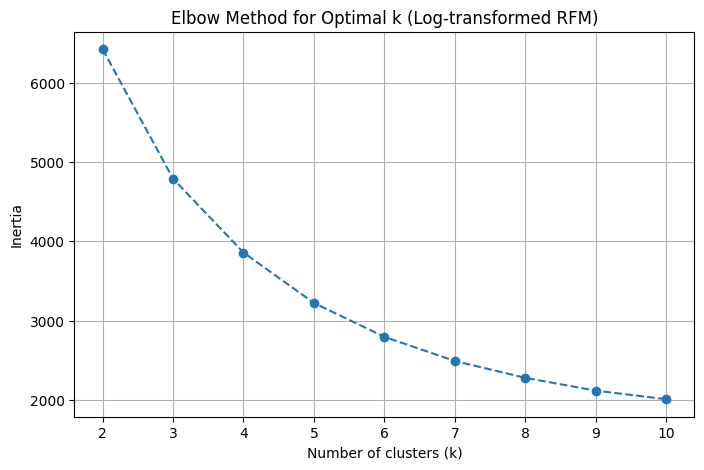

In [124]:
# Log-transform, scale RFM features, and determine optimal clusters

# Select numeric RFM features
rfm_cluster = rfm[['Recency', 'Frequency', 'Monetary']].copy()

# Apply log transformation to reduce skew (add 1 to avoid log(0))
rfm_log = np.log1p(rfm_cluster)

# Scale features
scaler = StandardScaler()
rfm_scaled = scaler.fit_transform(rfm_log)

# Elbow Method: test k = 2 to 10
inertia = []
k_range = range(2, 11)
for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(rfm_scaled)
    inertia.append(kmeans.inertia_)

# Plot the Elbow
plt.figure(figsize=(8,5))
plt.plot(k_range, inertia, marker='o', linestyle='--')
plt.xlabel('Number of clusters (k)')
plt.ylabel('Inertia')
plt.title('Elbow Method for Optimal k (Log-transformed RFM)')
plt.grid(True)
plt.show()

In [126]:
#  Apply K-Means using optimal k and label customers
#Using the Elbow plot, we determine the optimal number of clusters (k) and apply K-Means to segment customers based on their RFM scores.
optimal_k = 7
kmeans = KMeans(n_clusters=optimal_k, random_state=42)
rfm['Cluster'] = kmeans.fit_predict(rfm_scaled)

# view cluster centers in original RFM scale
cluster_centers = scaler.inverse_transform(kmeans.cluster_centers_)
cluster_centers_df = pd.DataFrame(cluster_centers, columns=['Recency', 'Frequency', 'Monetary'])
print("Cluster Centers (RFM scale):")
print(cluster_centers_df)

# Preview first 10 customers with cluster labels
rfm[['CustomerID', 'Recency', 'Frequency', 'Monetary', 'Cluster']].head(10)

Cluster Centers (RFM scale):
    Recency  Frequency  Monetary
0  2.488902   1.332071  6.554477
1  5.429574   0.749970  5.271505
2  3.913752   1.799426  7.532649
3  2.226048   2.179568  7.894140
4  4.709716   1.134988  6.598521
5  1.815890   3.159155  9.167228
6  3.607486   0.787232  5.437805


,CustomerID,Recency,Frequency,Monetary,Cluster
0,12346,326,1,201.60,1
1,12347,2,7,4262.00,3
2,12348,75,4,1437.24,2
3,12349,19,1,1457.55,0
4,12350,310,1,294.40,1
5,12352,36,7,1385.74,2
6,12353,204,1,89.00,1
7,12354,232,1,1079.40,4
8,12355,214,1,459.40,1
9,12356,23,3,2487.43,2


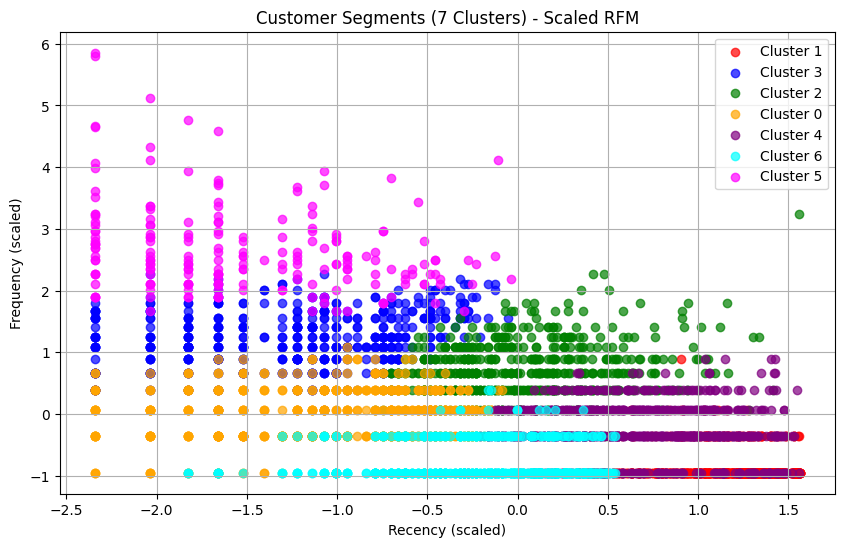

<Figure size 640x480 with 0 Axes>

In [123]:
# Plot Customer Segments in Scaled RFM Space (7 Clusters)

# Number of clusters
k = 7

# Define colors (add more if needed)
colors = ['red', 'blue', 'green', 'orange', 'purple', 'cyan', 'magenta']

plt.figure(figsize=(10,6))

for i, cluster in enumerate(rfm['Cluster'].unique()):
    cluster_indices = rfm['Cluster'] == cluster
    plt.scatter(
        rfm_scaled[cluster_indices, 0],  # Recency (scaled)
        rfm_scaled[cluster_indices, 1],  # Frequency (scaled)
        c=colors[i % len(colors)],       # cycle colors if needed
        label=f'Cluster {cluster}',
        alpha=0.7
    )

plt.xlabel('Recency (scaled)')
plt.ylabel('Frequency (scaled)')
plt.title(f'Customer Segments ({k} Clusters) - Scaled RFM')
plt.legend()
plt.grid(True)
plt.show()

# Save figure
plt.savefig(
    '/Users/2020m1/Downloads/Github-Repos/Customer-Market-Basket-Analytics/outputs/customer_segments.png',
    bbox_inches='tight'
)

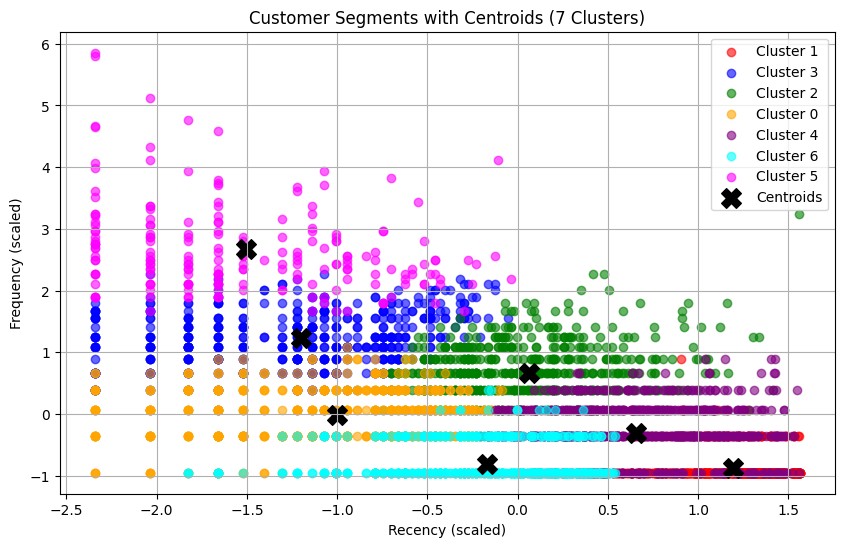

<Figure size 640x480 with 0 Axes>

In [127]:
# ======================================================
# Step 3: Plot Customer Segments with Cluster Centers
# ======================================================

plt.figure(figsize=(10,6))
colors = ['red', 'blue', 'green', 'orange', 'purple', 'cyan', 'magenta']

for i, cluster in enumerate(rfm['Cluster'].unique()):
    cluster_indices = rfm['Cluster'] == cluster
    plt.scatter(
        rfm_scaled[cluster_indices, 0],  # Recency (scaled)
        rfm_scaled[cluster_indices, 1],  # Frequency (scaled)
        c=colors[i % len(colors)],
        label=f'Cluster {cluster}',
        alpha=0.6
    )

# Plot cluster centers (scaled)
centers_scaled = scaler.transform(cluster_centers_df)  # transform RFM scale centers to scaled space
plt.scatter(
    centers_scaled[:,0],  # Recency
    centers_scaled[:,1],  # Frequency
    c='black',
    marker='X',
    s=200,
    label='Centroids'
)

plt.xlabel('Recency (scaled)')
plt.ylabel('Frequency (scaled)')
plt.title('Customer Segments with Centroids (7 Clusters)')
plt.legend()
plt.grid(True)
plt.show()

# Save figure for portfolio
plt.savefig(
    '/Users/2020m1/Downloads/Github-Repos/Customer-Market-Basket-Analytics/outputs/customer_segments_k7_centroids.png',
    bbox_inches='tight'
)